In [1]:
import pandas as pd
from qgrid import show_grid
import seaborn as sns
from pandas_profiling import ProfileReport
from funpymodeling.exploratory import freq_tbl, status, profiling_num, cat_vars, num_vars
from funpymodeling.data_prep import todf
import numpy as np
from sklearn.preprocessing import StandardScaler
import seaborn as sns; sns.set()
import matplotlib.pyplot as plt

In [2]:
# Fuente: proyecto prueba bot/archive/london_merged.csv
data=pd.read_csv("Londres_bici_compartida/london_merged.csv")

In [3]:
data.timestamp = pd.to_datetime(data.timestamp)
data = data.set_index("timestamp")

In [4]:
data["hour"] = data.index.hour
data["day_of_month"] = data.index.day
data["day_of_week"]  = data.index.dayofweek
data["month"] = data.index.month
data.head()

,cnt,t1,t2,hum,wind_speed,weather_code,is_holiday,is_weekend,season,hour,day_of_month,day_of_week,month
timestamp,,,,,,,,,,,,,
2015-01-04 00:00:00,182,3.0,2.0,93.0,6.0,3.0,0.0,1.0,3.0,0,4,6,1
2015-01-04 01:00:00,138,3.0,2.5,93.0,5.0,1.0,0.0,1.0,3.0,1,4,6,1
2015-01-04 02:00:00,134,2.5,2.5,96.5,0.0,1.0,0.0,1.0,3.0,2,4,6,1
2015-01-04 03:00:00,72,2.0,2.0,100.0,0.0,1.0,0.0,1.0,3.0,3,4,6,1
2015-01-04 04:00:00,47,2.0,0.0,93.0,6.5,1.0,0.0,1.0,3.0,4,4,6,1


In [5]:
data=data.reset_index(drop=False)

In [6]:
status(data)

,variable,q_nan,p_nan,q_zeros,p_zeros,unique,type
0,timestamp,0,0.0,0,0.000000,17414,datetime64[ns]
1,cnt,0,0.0,1,0.000057,3781,int64
2,t1,0,0.0,34,0.001952,73,float64
3,t2,0,0.0,232,0.013323,82,float64
4,hum,0,0.0,0,0.000000,143,float64
5,wind_speed,0,0.0,68,0.003905,103,float64
6,weather_code,0,0.0,0,0.000000,7,float64
7,is_holiday,0,0.0,17030,0.977949,2,float64
8,is_weekend,0,0.0,12444,0.714597,2,float64
9,season,0,0.0,4394,0.252326,4,float64


In [7]:
data.head()

,timestamp,cnt,t1,t2,hum,wind_speed,weather_code,is_holiday,is_weekend,season,hour,day_of_month,day_of_week,month
0,2015-01-04 00:00:00,182,3.0,2.0,93.0,6.0,3.0,0.0,1.0,3.0,0,4,6,1
1,2015-01-04 01:00:00,138,3.0,2.5,93.0,5.0,1.0,0.0,1.0,3.0,1,4,6,1
2,2015-01-04 02:00:00,134,2.5,2.5,96.5,0.0,1.0,0.0,1.0,3.0,2,4,6,1
3,2015-01-04 03:00:00,72,2.0,2.0,100.0,0.0,1.0,0.0,1.0,3.0,3,4,6,1
4,2015-01-04 04:00:00,47,2.0,0.0,93.0,6.5,1.0,0.0,1.0,3.0,4,4,6,1


In [8]:
data.shape

(17414, 14)

In [9]:
from qgrid import show_grid

show_grid(data, grid_options={'forceFitColumns': False, 'defaultColumnWidth': 200})

QgridWidget(grid_options={'fullWidthRows': True, 'syncColumnCellResize': True, 'forceFitColumns': False, 'defa…

In [10]:
from funpymodeling.exploratory import status 
status(data)

,variable,q_nan,p_nan,q_zeros,p_zeros,unique,type
0,timestamp,0,0.0,0,0.000000,17414,datetime64[ns]
1,cnt,0,0.0,1,0.000057,3781,int64
2,t1,0,0.0,34,0.001952,73,float64
3,t2,0,0.0,232,0.013323,82,float64
4,hum,0,0.0,0,0.000000,143,float64
5,wind_speed,0,0.0,68,0.003905,103,float64
6,weather_code,0,0.0,0,0.000000,7,float64
7,is_holiday,0,0.0,17030,0.977949,2,float64
8,is_weekend,0,0.0,12444,0.714597,2,float64
9,season,0,0.0,4394,0.252326,4,float64


In [11]:
from funpymodeling.exploratory import profiling_num


profiling_num(data)

,variable,mean,std_dev,variation_coef,p_0.01,p_0.05,p_0.25,p_0.5,p_0.75,p_0.95,p_0.99
0,cnt,1143.101642,1085.108068,0.949266,29.13,53.65,257.0,844.0,1671.75,3528.7,4552.74
1,t1,12.468091,5.571818,0.446886,1.00,4.00,8.0,12.5,16.00,22.0,25.50
2,t2,11.520836,6.615145,0.574190,-2.00,1.00,6.0,12.5,16.00,21.5,25.50
3,hum,72.324954,14.313186,0.197901,36.50,45.50,63.0,74.5,83.00,93.0,96.50
4,wind_speed,15.913063,7.894570,0.496106,2.00,5.00,10.0,15.0,20.50,30.5,38.00
5,weather_code,2.722752,2.341163,0.859852,1.00,1.00,1.0,2.0,3.00,7.0,7.00
6,is_holiday,0.022051,0.146854,6.659693,0.00,0.00,0.0,0.0,0.00,0.0,1.00
7,is_weekend,0.285403,0.451619,1.582393,0.00,0.00,0.0,0.0,1.00,1.0,1.00
8,season,1.492075,1.118911,0.749902,0.00,0.00,0.0,1.0,2.00,3.0,3.00
9,hour,11.513265,6.915893,0.600689,0.00,1.00,6.0,12.0,18.00,22.0,23.00


In [12]:
from pandas_profiling import ProfileReport

ProfileReport(data, minimal=True)

array([[<AxesSubplot:title={'center':'cnt'}>,
        <AxesSubplot:title={'center':'t1'}>,
        <AxesSubplot:title={'center':'t2'}>,
        <AxesSubplot:title={'center':'hum'}>],
       [<AxesSubplot:title={'center':'wind_speed'}>,
        <AxesSubplot:title={'center':'weather_code'}>,
        <AxesSubplot:title={'center':'is_holiday'}>,
        <AxesSubplot:title={'center':'is_weekend'}>],
       [<AxesSubplot:title={'center':'season'}>,
        <AxesSubplot:title={'center':'hour'}>,
        <AxesSubplot:title={'center':'day_of_month'}>,
        <AxesSubplot:title={'center':'day_of_week'}>],
       [<AxesSubplot:title={'center':'month'}>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>]], dtype=object)

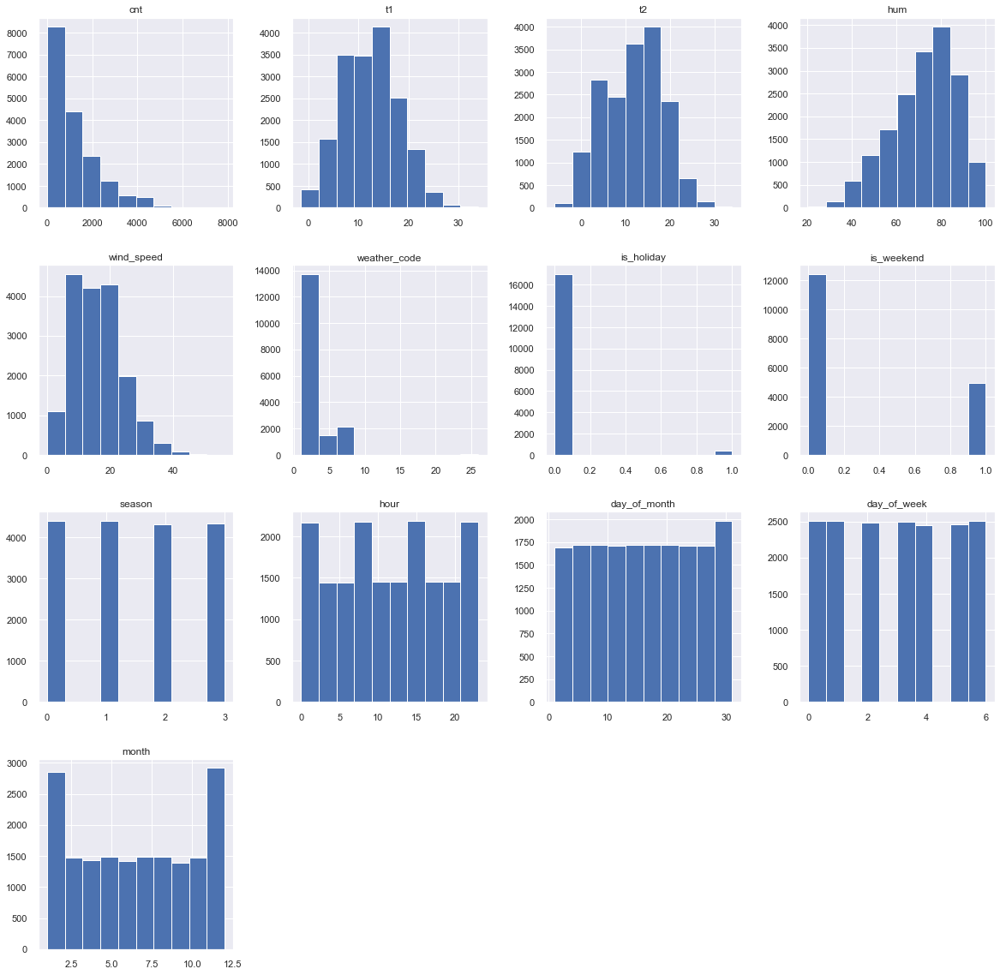

In [13]:
data.hist(figsize = (20,20))

<AxesSubplot:>

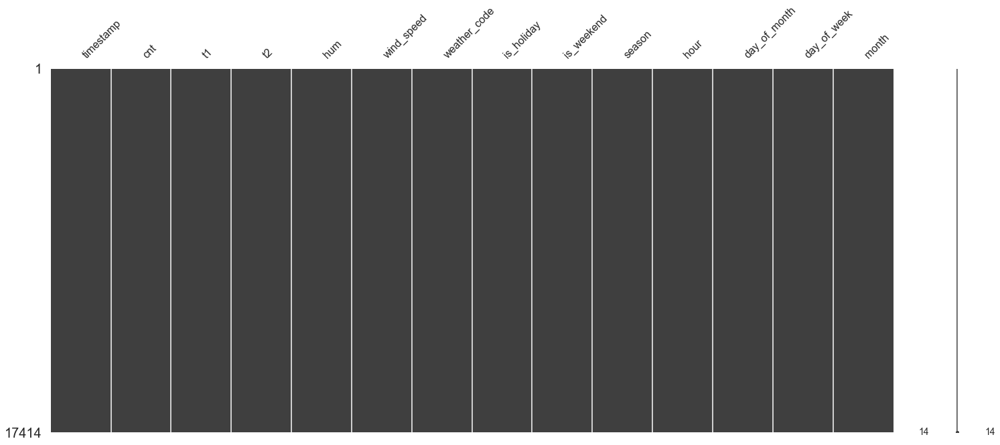

In [14]:
import missingno as msno
msno.matrix(data)

<AxesSubplot:>

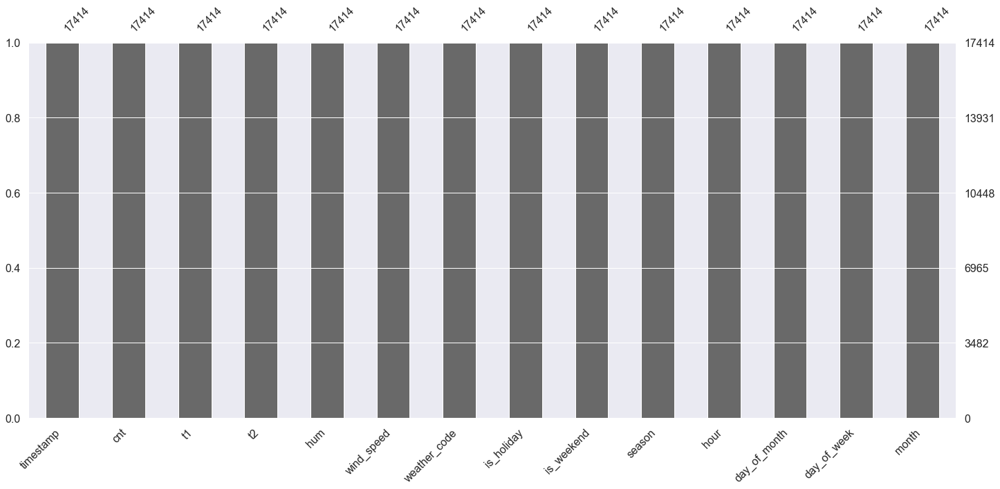

In [15]:
msno.bar(data)

In [16]:
cat_vars(data)

Index([], dtype='object')

**Preparación de datos**

In [17]:
x_data=data.copy()

# saquemos otras...
x_data=x_data.drop(['timestamp','hour','day_of_month','day_of_week','month','season'], axis=1)

In [18]:
#x_data['season']=x_data['season'].astype(str)

In [19]:
#,'hour','day_of_month','day_of_week','month','is_holiday'

**UMAP**

In [20]:
import umap
x_scaled = StandardScaler().fit_transform(x_data)
model_umap = umap.UMAP(n_components=2)

In [21]:
embedding = model_umap.fit_transform(x_scaled)
embedding.shape

(17414, 2)

In [22]:
x_data2=x_data.copy()
x_data2=x_data2.reset_index(drop=True) # IMPORTANTEEEEE!
x_data2[['dim1', 'dim2']]=embedding

In [23]:
x_data2

,cnt,t1,t2,hum,wind_speed,weather_code,is_holiday,is_weekend,dim1,dim2
0,182,3.0,2.0,93.0,6.0,3.0,0.0,1.0,17.715046,5.689469
1,138,3.0,2.5,93.0,5.0,1.0,0.0,1.0,17.536310,6.070465
2,134,2.5,2.5,96.5,0.0,1.0,0.0,1.0,17.590311,5.962125
3,72,2.0,2.0,100.0,0.0,1.0,0.0,1.0,17.590782,5.946587
4,47,2.0,0.0,93.0,6.5,1.0,0.0,1.0,17.460497,6.374716
...,...,...,...,...,...,...,...,...,...,...
17409,1042,5.0,1.0,81.0,19.0,3.0,0.0,0.0,4.649576,14.182139
17410,541,5.0,1.0,81.0,21.0,4.0,0.0,0.0,4.019859,14.407681
17411,337,5.5,1.5,78.5,24.0,4.0,0.0,0.0,3.922624,14.435789
17412,224,5.5,1.5,76.0,23.0,4.0,0.0,0.0,3.918650,14.446028


In [24]:
status(x_data2)

,variable,q_nan,p_nan,q_zeros,p_zeros,unique,type
0,cnt,0,0.0,1,0.000057,3781,int64
1,t1,0,0.0,34,0.001952,73,float64
2,t2,0,0.0,232,0.013323,82,float64
3,hum,0,0.0,0,0.000000,143,float64
4,wind_speed,0,0.0,68,0.003905,103,float64
5,weather_code,0,0.0,0,0.000000,7,float64
6,is_holiday,0,0.0,17030,0.977949,2,float64
7,is_weekend,0,0.0,12444,0.714597,2,float64
8,dim1,0,0.0,0,0.000000,17404,float64
9,dim2,0,0.0,0,0.000000,17409,float64


<AxesSubplot:xlabel='dim1', ylabel='dim2'>

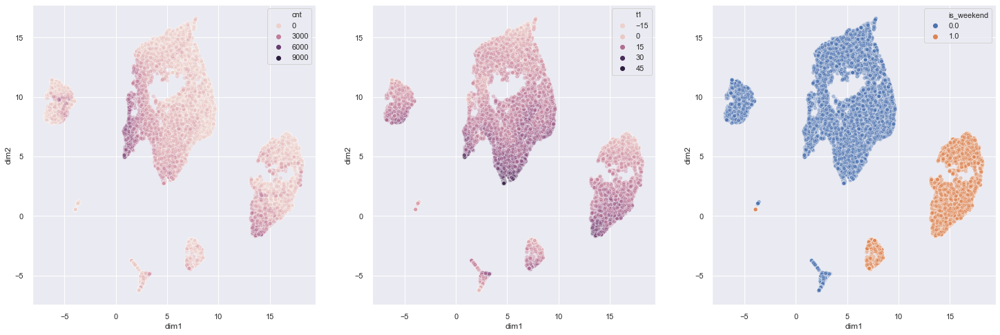

In [25]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(25,8))
sns.scatterplot(x="dim1", y="dim2", hue="cnt", data=x_data2, alpha=0.4, ax=ax1)
sns.scatterplot(x="dim1", y="dim2", hue="t1", data=x_data2, alpha=0.4, ax=ax2)
sns.scatterplot(x="dim1", y="dim2", hue="is_weekend", data=x_data2, alpha=0.4, ax=ax3)

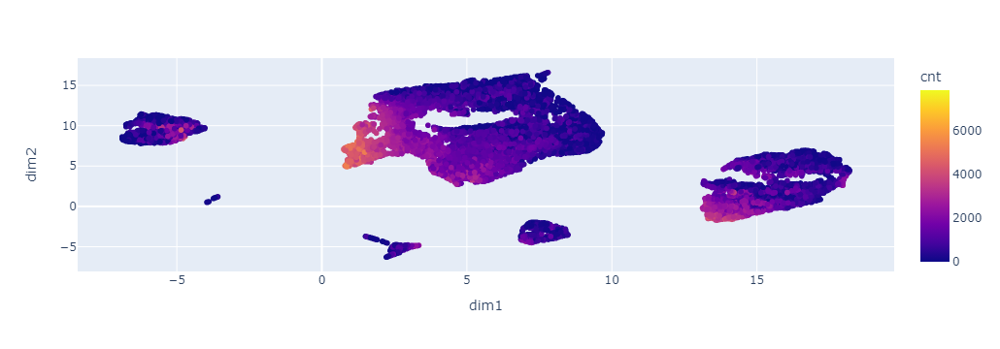

In [26]:
import plotly.express as px

fig = px.scatter(x_data2, x="dim1", y="dim2", color="cnt", hover_data=['cnt','t1','is_weekend'])
fig.show()

**Modelo**

In [27]:
x_data3=x_data2.copy()
x_data3_coord_proy=x_data3.loc[:,['dim1','dim2']]

In [28]:
import hdbscan
model_hdb_bike = hdbscan.HDBSCAN(min_cluster_size=1000, prediction_data = True).fit(x_data3_coord_proy)

In [29]:
freq_tbl(model_hdb_bike.labels_.astype('str'))

,0,frequency,percentage,cumulative_perc
0,2,10579,0.607500,0.607500
1,0,4310,0.247502,0.855002
2,1,1449,0.083209,0.938211
3,-1,1076,0.061789,1.000000


In [30]:
cluster_var='cluster'          # definan nombre de var de clustering
x_data_cluster=x_data3.copy()       # aca agregue todos los datos para que aparezcan en el dataset
x_data_cluster[cluster_var]=model_hdb_bike.labels_    

In [31]:
x_data_cluster.head()

,cnt,t1,t2,hum,wind_speed,weather_code,is_holiday,is_weekend,dim1,dim2,cluster
0,182,3.0,2.0,93.0,6.0,3.0,0.0,1.0,17.715046,5.689469,0
1,138,3.0,2.5,93.0,5.0,1.0,0.0,1.0,17.536310,6.070465,0
2,134,2.5,2.5,96.5,0.0,1.0,0.0,1.0,17.590311,5.962125,0
3,72,2.0,2.0,100.0,0.0,1.0,0.0,1.0,17.590782,5.946587,0
4,47,2.0,0.0,93.0,6.5,1.0,0.0,1.0,17.460497,6.374716,0


In [32]:
show_grid(x_data_cluster, grid_options={'forceFitColumns': False, 'defaultColumnWidth': 200})

QgridWidget(grid_options={'fullWidthRows': True, 'syncColumnCellResize': True, 'forceFitColumns': False, 'defa…

In [33]:
from sklearn.metrics import silhouette_score, silhouette_samples

sil_avg = silhouette_score(x_data_cluster, model_hdb_bike.labels_)

In [34]:
sil_avg

-0.22003277117761968

In [35]:
sample_silhouette_values = silhouette_samples(x_data_cluster, model_hdb_bike.labels_)

In [36]:
sample_silhouette_values

array([-0.46506737, -0.46019073, -0.4589659 , ..., -0.58455772,
       -0.58988047, -0.57634932])

In [37]:
res_sil=pd.DataFrame({'sil_value': sample_silhouette_values, 'cluster': model_hdb_bike.labels_})

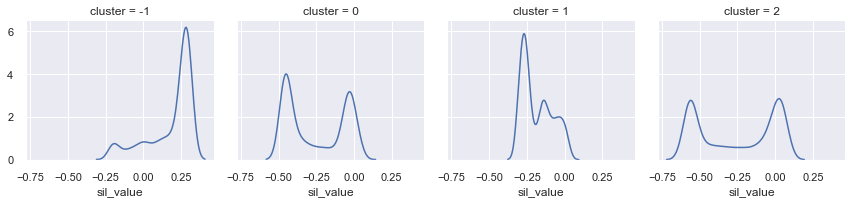

In [38]:
g = sns.FacetGrid(res_sil, col='cluster')
g = g.map(sns.kdeplot, 'sil_value')

In [39]:
res_sil.groupby('cluster').mean('sil_value')

,sil_value
cluster,
-1,0.182306
0,-0.252898
1,-0.181843
2,-0.252796


In [40]:
x_data_cluster=x_data_cluster[x_data_cluster['cluster']!=-1]

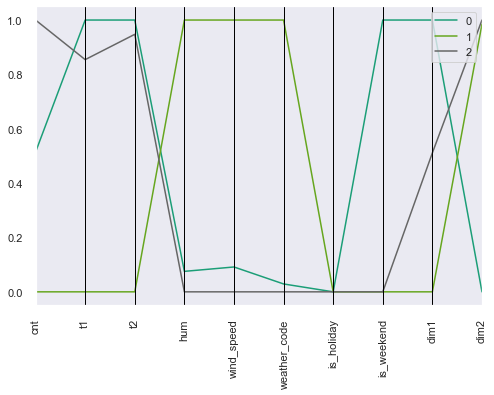

In [41]:
from funpymodeling.model_validation import coord_plot
d_orig, d_transf = coord_plot(x_data_cluster, cluster_var)

In [42]:
pd.options.display.max_columns = None

In [43]:
d_orig

,cnt,t1,t2,hum,wind_speed,weather_code,is_holiday,is_weekend,dim1,dim2,cluster
0,1047.003480,12.642305,11.704370,71.409687,15.778094,2.128306,0.0,1.0,15.550846,2.638881,0
1,795.454106,12.301932,11.312974,81.863354,18.105935,7.024845,0.0,0.0,-5.565656,9.456930,1
2,1284.527933,12.592731,11.683808,70.557945,15.543766,1.982040,0.0,0.0,5.230485,9.562928,2


In [44]:
d_transf

,cnt,t1,t2,hum,wind_speed,weather_code,is_holiday,is_weekend,dim1,dim2,cluster
0,0.514338,1.000000,1.000000,0.075339,0.091457,0.029005,0.0,1.0,1.000000,0.000000,0
1,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.0,0.0,0.000000,0.984691,1
2,1.000000,0.854354,0.947465,0.000000,0.000000,0.000000,0.0,0.0,0.511266,1.000000,2


In [45]:
status(x_data_cluster)

,variable,q_nan,p_nan,q_zeros,p_zeros,unique,type
0,cnt,0,0.0,0,0.000000,3770,int64
1,t1,0,0.0,34,0.002081,73,float64
2,t2,0,0.0,203,0.012425,82,float64
3,hum,0,0.0,0,0.000000,142,float64
4,wind_speed,0,0.0,66,0.004040,99,float64
5,weather_code,0,0.0,0,0.000000,6,float64
6,is_holiday,0,0.0,16338,1.000000,1,float64
7,is_weekend,0,0.0,12028,0.736198,2,float64
8,dim1,0,0.0,0,0.000000,16329,float64
9,dim2,0,0.0,0,0.000000,16333,float64


In [46]:
freq_tbl(x_data_cluster['cluster'].astype(str))

,cluster,frequency,percentage,cumulative_perc
0,2,10579,0.647509,0.647509
1,0,4310,0.263802,0.911311
2,1,1449,0.088689,1.000000


<AxesSubplot:xlabel='dim1', ylabel='dim2'>

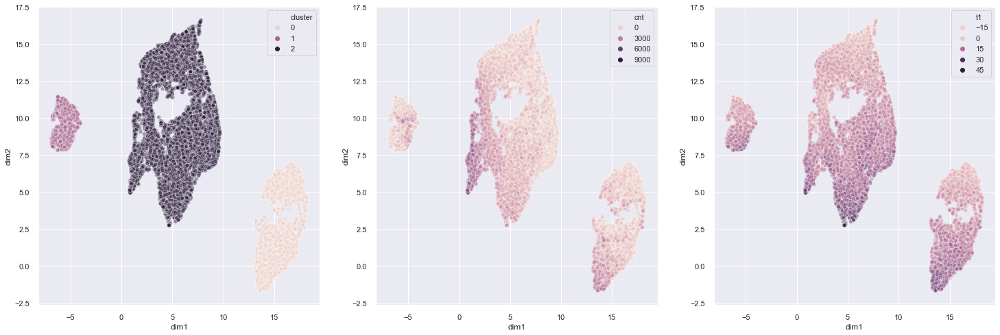

In [64]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(25,8))
sns.scatterplot(x="dim1", y="dim2", hue="cluster", data=x_data_cluster, alpha=0.4, ax=ax1)
sns.scatterplot(x="dim1", y="dim2", hue="cnt", data=x_data_cluster, alpha=0.4, ax=ax2)
sns.scatterplot(x="dim1", y="dim2", hue="t1", data=x_data_cluster, alpha=0.4, ax=ax3)

<AxesSubplot:xlabel='dim1', ylabel='dim2'>

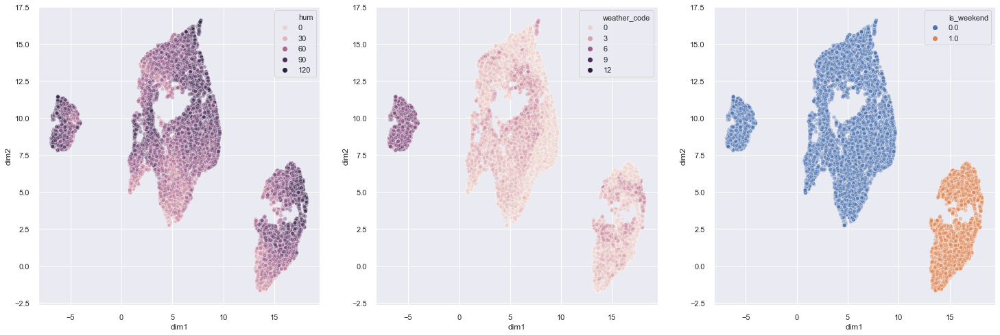

In [67]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(25,8))
sns.scatterplot(x="dim1", y="dim2", hue="hum", data=x_data_cluster, alpha=0.4, ax=ax1)
sns.scatterplot(x="dim1", y="dim2", hue="weather_code", data=x_data_cluster, alpha=0.4, ax=ax2)
sns.scatterplot(x="dim1", y="dim2", hue="is_weekend", data=x_data_cluster, alpha=0.4, ax=ax3)

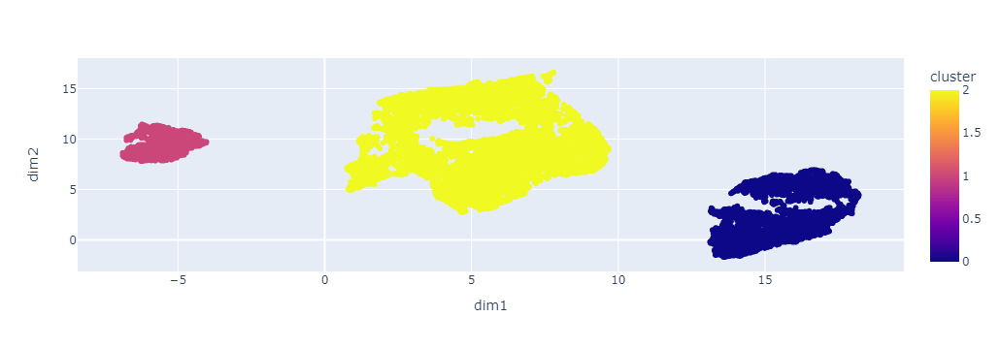

In [48]:
import plotly.express as px

fig = px.scatter(x_data_cluster, x="dim1", y="dim2", color="cluster", hover_data=['cnt','hum','is_weekend'])
fig.show()